<a href="https://colab.research.google.com/github/williamlidberg/Whitebox-tutorial/blob/main/Whitebox_tools_in_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Whitebox tutorial
A guide for dummies by William Liberg

Reproducibility is a major principle of the scientific method and it is even more important for AI methods. Google colab is a good way to colaborate and share reproducable examples of working code. Whitebox-tools is avalible as python package https://pypi.org/project/whitebox/ which makes it possible to run on google colab.

Whitebox can be installed from pypip

In [ ]:
!pip install whitebox
!pip install tifffile
!pip install matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 79 kB 3.3 MB/s 


## Data
The [Krycklan catchment](Topographical-modeling-for-hydrological-features) will be used for this tutorial. The data consists of a digital elevation model with a 5 meter resolution and vector layers representing streams, culverts and roads within the catchment. Download the data from this repository: https://github.com/williamlidberg/Topographical-modeling-for-hydrological-features

In [ ]:
!git clone https://github.com/williamlidberg/Whitebox-tutorial /tutorial/ 

Cloning into '/tutorial'...
remote: Enumerating objects: 41, done.
remote: Counting objects: 100% (41/41), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 41 (delta 8), reused 16 (delta 2), pack-reused 0
Unpacking objects: 100% (41/41), done.


The relevant data will be stored under /content/Whitebox-tutorial/data



*   Extendedroads contains all roads in the catchment with a modification that extends the roads across culvert locations. This was done to burn culverts into the DEM across roads.
*   Culverts contains manually mapped culverts within the catchment.
*   dem is a digital elevation model with the resolution of 5 meter.



# Extract streams from a high resolution digital elevation model
Extracting stream networks from high resolution dems is a common workflow. This is an example on how to do it using whitebox tools. For more details on the tools please look at: https://www.whiteboxgeo.com/manual/wbt_book/intro.html

First the digital elevation model needs to be pre-processed to be hydrologically compatible. This means that an imagenry drop of water need to have a path from each pixel in the dem to the edge of the dem. "Filling" is a normal way to achive this but it does not work well on high resolution dems where most large obstacles are from human made objects such as road enbankment.

## Pre-processing the digital elevation model

The road below site 16 in Krycklan creates a dam in the DEM. A stream channel is visible both upstream and downstream of the road in the original digital elevation model.

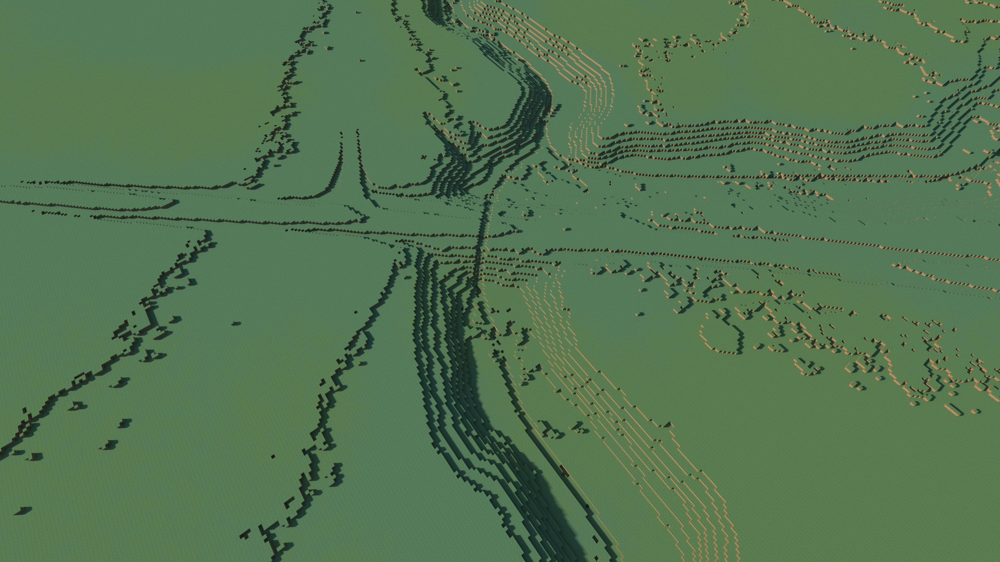

[Filling](https://www.whiteboxgeo.com/manual/wbt_book/available_tools/hydrological_analysis.html?highlight=fill#filldepressions) creates a flat area of arbitrary values upstream of the road embankment, which results in parallel and unrealistic stream segments.

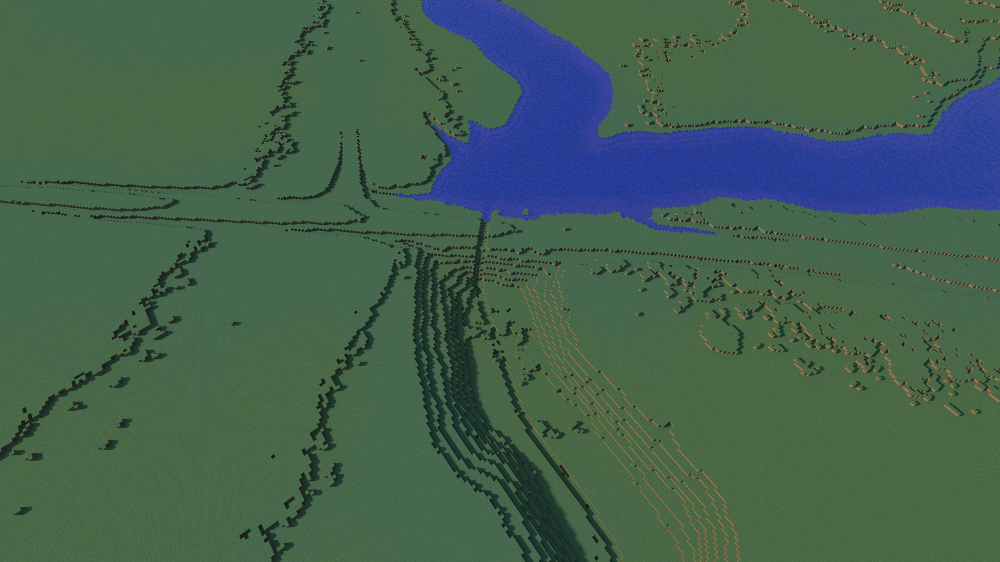

[Breaching](https://www.whiteboxgeo.com/manual/wbt_book/available_tools/hydrological_analysis.html?highlight=fill#BreachDepressions), on the other hand, manages to utilize the flow path information of the area upstream of the road embankment. [(Lidberg et al 2017)](https://onlinelibrary.wiley.com/doi/full/10.1002/hyp.11385).

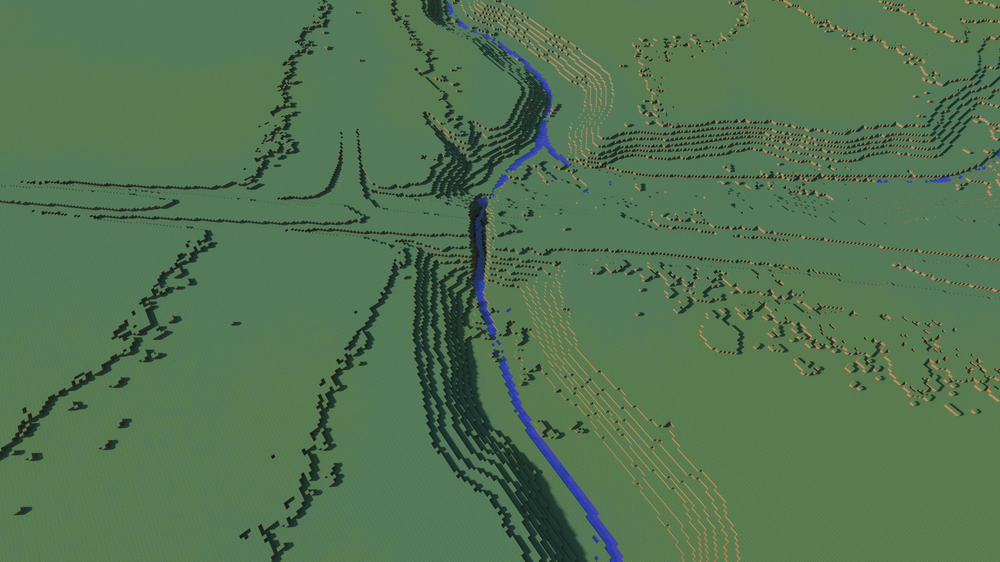

One of the most important differences between filling and breaching is not where they cross a road but rather how they affect the upstream flow paths. We can use information from topographical maps to breach some of these roadenbankments. [The method is called Burn streams at roads](https://www.whiteboxgeo.com/manual/wbt_book/available_tools/hydrological_analysis.html?highlight=fill#BurnStreamsAtRoads) and normaly uses streams and roads as vector lines as input.

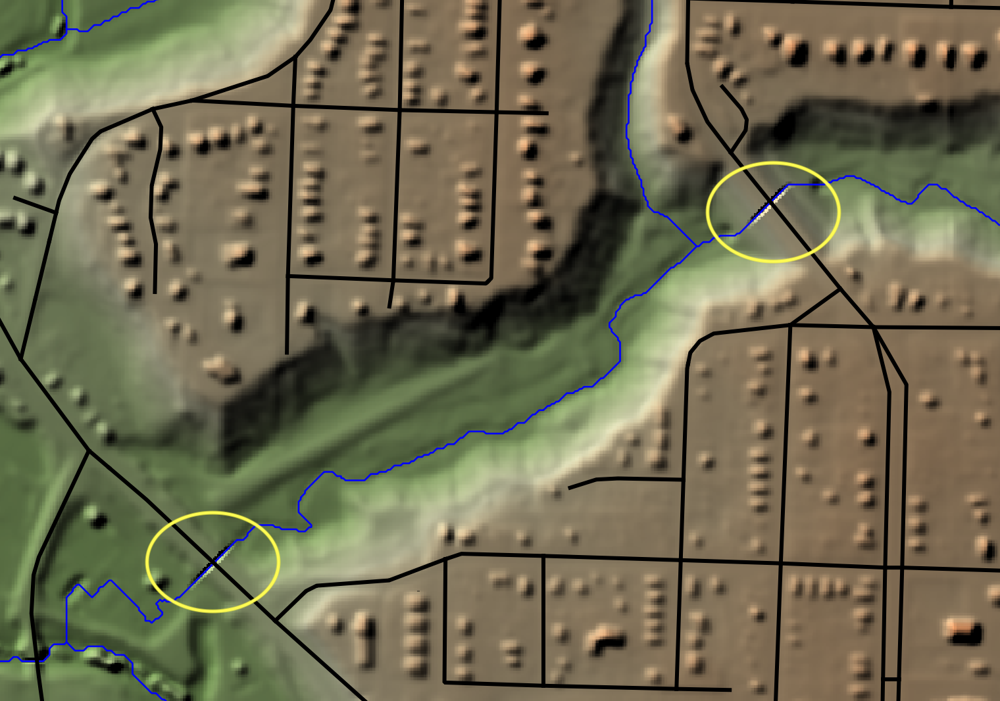

We will use Krycklan as demo area in this tutorial. Start by inspecting the dem.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in log
  import sys


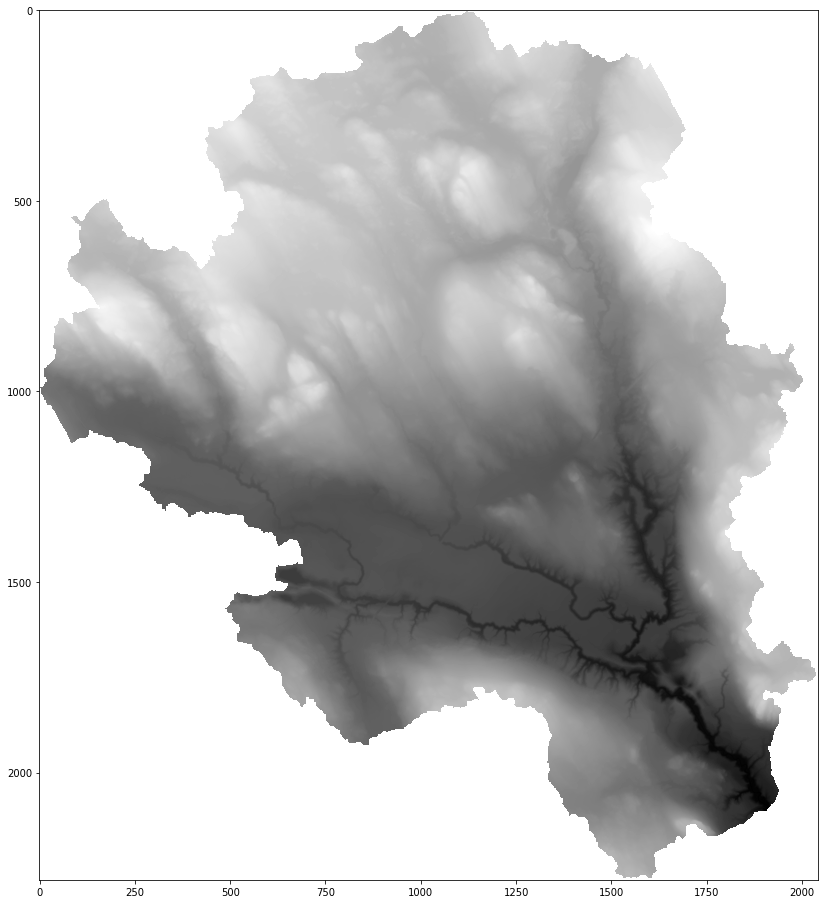

In [ ]:
import tifffile
import matplotlib.pyplot as plt
import numpy as np

# size of plot
d8flowacc = tifffile.imread('/tutorial/data/dem.tif')
log = np.log(d8flowacc)
plt.imshow(log, cmap='gray')


## Step one: Burning streams across roads

In [ ]:
import whitebox
wbt = whitebox.WhiteboxTools()
wbt.verbose=True

# inputs
dem = '/tutorial/data/dem.tif'
streams = '/tutorial/data/culverts.shp'
roads = '/tutorial/data/Extendedroads.shp'
# output 
roadburned = '/tutorial/data/roadburneddem.tif'
road_width = 10

# Burn streams across roads
wbt.burn_streams_at_roads(
    dem = dem, 
    streams = streams, 
    roads = roads, 
    output = roadburned, 
    width=road_width,
)

Decompressing WhiteboxTools_linux_amd64.zip ...
WhiteboxTools package directory: /usr/local/lib/python3.7/dist-packages/whitebox
./whitebox_tools --run="BurnStreamsAtRoads" --dem='/tutorial/data/dem.tif' --streams='/tutorial/data/culverts.shp' --roads='/tutorial/data/Extendedroads.shp' --output='/tutorial/data/roadburneddem.tif' --width='10' -v --compress_rasters=False

*********************************
* Welcome to BurnStreamsAtRoads *
* Powered by WhiteboxTools      *
* www.whiteboxgeo.com           *
*********************************
Reading streams and roads data...
Reading DEM raster...
Rasterizing Streams: 0%
Rasterizing Streams: 1%
Rasterizing Streams: 2%
Rasterizing Streams: 3%
Rasterizing Streams: 4%
Rasterizing Streams: 5%
Rasterizing Streams: 6%
Rasterizing Streams: 7%
Rasterizing Streams: 8%
Rasterizing Streams: 9%
Rasterizing Streams: 10%
Rasterizing Streams: 11%
Rasterizing Streams: 12%
Rasterizing Streams: 13%
Rasterizing Streams: 14%
Rasterizing Streams: 15%
Rasterizing

0

## Step two: Resolve all remaining depressions

In [ ]:
# Inputs
roadburneddem = '/tutorial/data/roadburneddem.tif'

# Outputs
breacheddem = '/tutorial/data/breacheddem.tif'

# Resolve all remaining depressions
wbt.breach_depressions(
    dem = roadburneddem, 
    output = breacheddem, 
    max_depth=None, # if a max depth is set it will prevent sinks deeper than that to be breached.
    max_length=None, # if a max length is set it will prevent sinks that require a path longer than that to be breached.
    flat_increment=0.001, # if flat surfaces suck as lakes have the slope 0 it will act like a sink. This parameter will set a small slope to flat areas.
    fill_pits=True # Pits are sinks that are just one pixel big.
)

./whitebox_tools --run="BreachDepressions" --dem='/tutorial/data/roadburneddem.tif' --output='/tutorial/data/breacheddem.tif' --flat_increment='0.001' --fill_pits -v --compress_rasters=False

********************************
* Welcome to BreachDepressions *
* Powered by WhiteboxTools     *
* www.whiteboxgeo.com          *
********************************
Reading data...
Filling pits: 0%
Filling pits: 1%
Filling pits: 2%
Filling pits: 3%
Filling pits: 4%
Filling pits: 5%
Filling pits: 6%
Filling pits: 7%
Filling pits: 8%
Filling pits: 9%
Filling pits: 10%
Filling pits: 11%
Filling pits: 12%
Filling pits: 13%
Filling pits: 14%
Filling pits: 15%
Filling pits: 16%
Filling pits: 17%
Filling pits: 18%
Filling pits: 19%
Filling pits: 20%
Filling pits: 21%
Filling pits: 22%
Filling pits: 23%
Filling pits: 24%
Filling pits: 25%
Filling pits: 26%
Filling pits: 27%
Filling pits: 28%
Filling pits: 29%
Filling pits: 30%
Filling pits: 31%
Filling pits: 32%
Filling pits: 33%
Filling pits: 34%
Filling

0

## Flow Accumulation

In [ ]:
breacheddem = '/tutorial/data/breacheddem.tif'
d8_flow_pointer = '/tutorial/D8FlowPointer.tif'
d8_flow_accumulation = '/tutorial/D8FlowAcc.tif'

# Flow pointer
wbt.d8_pointer(
    dem = breacheddem, 
    output = d8_flow_pointer, 
    esri_pntr=False
)

# Flow accumulation
wbt.d8_flow_accumulation(
    i = d8_flow_pointer, 
    output = d8_flow_accumulation, 
    out_type = 'catchment area', 
    log=False, 
    clip=False, 
    pntr=True, 
    esri_pntr=False
)

./whitebox_tools --run="D8Pointer" --dem='/tutorial/data/breacheddem.tif' --output='/tutorial/D8FlowPointer.tif' -v --compress_rasters=False

****************************
* Welcome to D8Pointer     *
* Powered by WhiteboxTools *
* www.whiteboxgeo.com      *
****************************
Reading data...
Progress: 0%
Progress: 1%
Progress: 2%
Progress: 3%
Progress: 4%
Progress: 5%
Progress: 6%
Progress: 7%
Progress: 8%
Progress: 9%
Progress: 10%
Progress: 11%
Progress: 12%
Progress: 13%
Progress: 14%
Progress: 15%
Progress: 16%
Progress: 17%
Progress: 18%
Progress: 19%
Progress: 20%
Progress: 21%
Progress: 22%
Progress: 23%
Progress: 24%
Progress: 25%
Progress: 26%
Progress: 27%
Progress: 28%
Progress: 29%
Progress: 30%
Progress: 31%
Progress: 32%
Progress: 33%
Progress: 34%
Progress: 35%
Progress: 36%
Progress: 37%
Progress: 38%
Progress: 39%
Progress: 40%
Progress: 41%
Progress: 42%
Progress: 43%
Progress: 44%
Progress: 45%
Progress: 46%
Progress: 47%
Progress: 48%
Progress: 49%
Progres

0

In [ ]:
dinfflowacc = '/tutorial/DinfFlowAcc.tif'
wbt.d_inf_flow_accumulation(
    i = breacheddem, 
    output = dinfflowacc, 
    out_type='catchment area', 
    threshold=None, 
    log=False, 
    clip=False, 
    pntr=False
)

./whitebox_tools --run="DInfFlowAccumulation" --input='/tutorial/data/breacheddem.tif' --output='/tutorial/DinfFlowAcc.tif' --out_type=catchment area -v --compress_rasters=False

***********************************
* Welcome to DInfFlowAccumulation *
* Powered by WhiteboxTools        *
* www.whiteboxgeo.com             *
***********************************
Reading data...
Flow directions: 0%
Flow directions: 1%
Flow directions: 2%
Flow directions: 3%
Flow directions: 4%
Flow directions: 5%
Flow directions: 6%
Flow directions: 7%
Flow directions: 8%
Flow directions: 9%
Flow directions: 10%
Flow directions: 11%
Flow directions: 12%
Flow directions: 13%
Flow directions: 14%
Flow directions: 15%
Flow directions: 16%
Flow directions: 17%
Flow directions: 18%
Flow directions: 19%
Flow directions: 20%
Flow directions: 21%
Flow directions: 22%
Flow directions: 23%
Flow directions: 24%
Flow directions: 25%
Flow directions: 26%
Flow directions: 27%
Flow directions: 28%
Flow directions: 29%
Flow 

0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in log
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in log
  # Remove the CWD from sys.path while we load stuff.


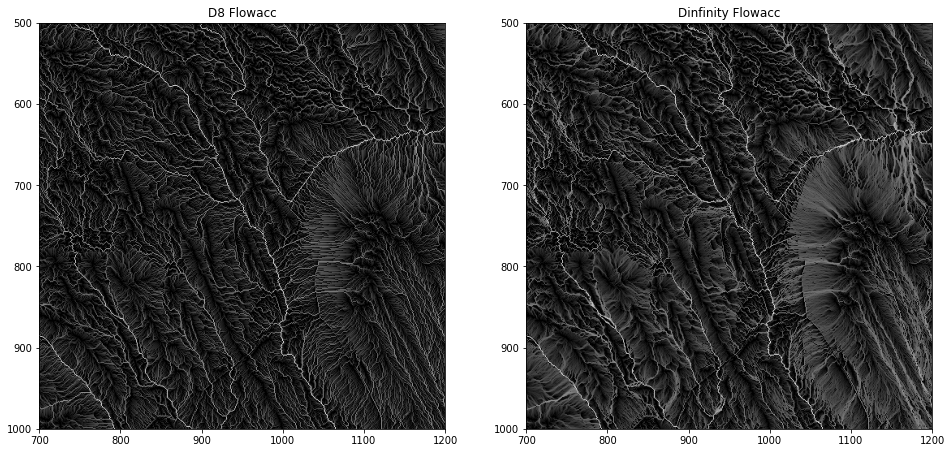

In [ ]:
import tifffile
import matplotlib.pyplot as plt
import numpy as np

# size of plot
d8flowacc = tifffile.imread('/tutorial/D8FlowAcc.tif')
logd8 = np.log(d8flowacc)
#plt.imshow(log, cmap='gray')
dinfflowacc = tifffile.imread('/tutorial/DinfFlowAcc.tif')
logdinf = np.log(dinfflowacc)


f, axarr = plt.subplots(1,2)
axarr[0].set_ylim((1000,500))
axarr[0].set_xlim((700,1200))
axarr[0].set_title('D8 Flowacc')
axarr[0].imshow(logd8, cmap='Greys_r')

axarr[1].set_ylim((1000,500))
axarr[1].set_xlim((700,1200))
axarr[1].set_title('Dinfinity Flowacc')
axarr[1].imshow(logdinf, cmap='Greys_r')

From the flow accumulation grid we can extract vector stream lines by setting a stream initation threshold. 6 ha is a resonable default threshold in Sweden but it varries with soil texture, climate region and topography.

## Extract Streams

In [ ]:
rasterstreams = '/tutorial/RasterStreams.tif'
vectorstreams = '/tutorial/VectorStreams6ha.shp'
threshold = 60000

wbt.extract_streams(
    flow_accum = d8_flow_accumulation, 
    output = rasterstreams, 
    threshold = threshold, 
    zero_background=False
)

# convert raster streams to vector
wbt.raster_streams_to_vector(
    streams = rasterstreams, 
    d8_pntr = d8_flow_pointer, 
    output = vectorstreams, 
    esri_pntr=False
)

./whitebox_tools --run="ExtractStreams" --flow_accum='/tutorial/D8FlowAcc.tif' --output='/tutorial/RasterStreams.tif' --threshold='60000' -v --compress_rasters=False

*****************************
* Welcome to ExtractStreams *
* Powered by WhiteboxTools  *
* www.whiteboxgeo.com       *
*****************************
Reading data...
Progress: 0%
Progress: 1%
Progress: 2%
Progress: 3%
Progress: 4%
Progress: 5%
Progress: 6%
Progress: 7%
Progress: 8%
Progress: 9%
Progress: 10%
Progress: 11%
Progress: 12%
Progress: 13%
Progress: 14%
Progress: 15%
Progress: 16%
Progress: 17%
Progress: 18%
Progress: 19%
Progress: 20%
Progress: 21%
Progress: 22%
Progress: 23%
Progress: 24%
Progress: 25%
Progress: 26%
Progress: 27%
Progress: 28%
Progress: 29%
Progress: 30%
Progress: 31%
Progress: 32%
Progress: 33%
Progress: 34%
Progress: 35%
Progress: 36%
Progress: 37%
Progress: 38%
Progress: 39%
Progress: 40%
Progress: 41%
Progress: 42%
Progress: 43%
Progress: 44%
Progress: 45%
Progress: 46%
Progress: 47%
Progr

0

## Putting it all together
You probably noticed that there are many intermediate steps in this process. If we don't need them we can store them in a temporary location and remove them when we are done.

In [ ]:
!mkdir '/tempdir'

The pythonscript streams.py is an example how how a temporary directory is used for the intermediate steps. Using a RAMdisk for these intermediate steps will reduce processing times for workflows which contains alot of intermediate files.

In [ ]:
!python /tutorial/streams.py

./whitebox_tools --run="BurnStreamsAtRoads" --dem='/tutorial/data/dem.tif' --streams='/tutorial/data/culverts.shp' --roads='/tutorial/data/Extendedroads.shp' --output='/tempdir/roadburneddem.tif' --width='10' -v --compress_rasters=False

*********************************
* Welcome to BurnStreamsAtRoads *
* Powered by WhiteboxTools      *
* www.whiteboxgeo.com           *
*********************************
Reading streams and roads data...
Reading DEM raster...
Rasterizing Streams: 0%
Rasterizing Streams: 1%
Rasterizing Streams: 2%
Rasterizing Streams: 3%
Rasterizing Streams: 4%
Rasterizing Streams: 5%
Rasterizing Streams: 6%
Rasterizing Streams: 7%
Rasterizing Streams: 8%
Rasterizing Streams: 9%
Rasterizing Streams: 10%
Rasterizing Streams: 11%
Rasterizing Streams: 12%
Rasterizing Streams: 13%
Rasterizing Streams: 14%
Rasterizing Streams: 15%
Rasterizing Streams: 16%
Rasterizing Streams: 17%
Rasterizing Streams: 18%
Rasterizing Streams: 19%
Rasterizing Streams: 20%
Rasterizing Streams: 

## References

WhiteboxTools: https://github.com/jblindsay/whitebox-tools

PyPI: https://pypi.org/project/whitebox/

Contact: William.lidberg@slu.se